### Notebook for the integration benchmark with the `scIB` package 

- **Developed by:** Anna Maguza
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- 11th April 2022

### Load required modules

In [1]:
from scvi_colab import install

In [2]:
import anndata as an
import scanpy as sc
import scvi
from rich import print
import scib
import scib.metrics
from scvi.model.utils import mde

Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scib_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as snsll

from umap import UMAP
import warnings; warnings.simplefilter('ignore')

/Users/anna.maguza/miniconda3/envs/scib_env/lib/python3.9/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [4]:
from scib_metrics.benchmark import Benchmarker

In [5]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.0
scanpy      1.9.3
-----
PIL                         9.5.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
certifi                     2022.12.07
charset_normalizer          3.1.0
chex                        0.1.7
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
deprecated                  1.2.13
docrep                      0.3.2
dot_parser                  NA
etils                       1.2.0
executing                   0.8.3
flax                        0.6.8
fsspec                      2023.4.0
h5py                        3.8.0
idna                        3.4
igraph                      0.10.4
importlib_resources         NA
ipykernel                   6.19.2
jax    

# 3000 HVGs

### Read datasets

In [6]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_3K_HVG.h5ad'
output = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_3K_HVG_output.h5ad'
adata = sc.read_h5ad(input)

In [7]:
# Rename C_scANVI to the 'Predicted stem cells' label
adata.obs['Predicted cell labels'] = adata.obs['C_scANVI']

In [8]:
bm = Benchmarker(
    adata,
    batch_key="Donor_ID",
    label_key="C_scANVI",
    embedding_obsm_keys=["X_pca", "X_scANVI"],
    n_jobs=-1,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:06)


Embeddings: 100%|██████████| 2/2 [04:02<00:00, 121.07s/it]


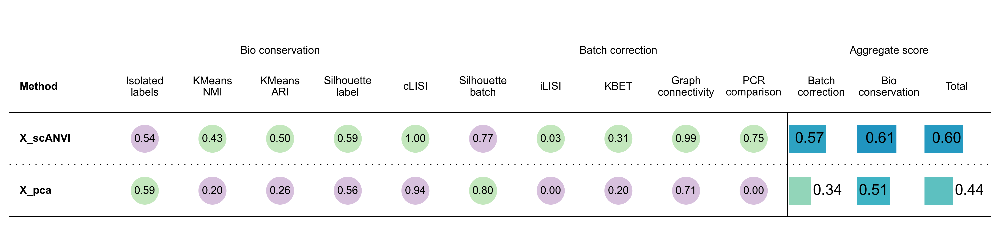

In [11]:
bm.plot_results_table(min_max_scale=False)

In [12]:
df = bm.get_results(min_max_scale=False)
print(df)

Isolated labels        KMeans NMI        KMeans ARI  \
Embedding                                                           
X_pca                0.585027          0.200958          0.262267   
X_scANVI             0.543619          0.434194          0.495322   
Metric Type  Bio conservation  Bio conservation  Bio conservation   

             Silhouette label             cLISI  Silhouette batch  \
Embedding                                                           
X_pca                0.564048          0.941136           0.79826   
X_scANVI             0.593485               1.0           0.77125   
Metric Type  Bio conservation  Bio conservation  Batch correction   

                        iLISI              KBET Graph connectivity  \
Embedding                                                            
X_pca                0.000585          0.199102           0.707474   
X_scANVI             0.028257          0.307129           0.988227   
Metric Type  Batch correction  Batch correction   Batch correction   

               PCR comparison Batch correction Bio conservation  \
Embedding                                                         
X_pca                     0.0         0.341084         0.510687   
X_scANVI             0.753154         0.569604         0.613324   
Metric Type  Batch correction  Aggregate score  Aggregate score   

                       Total  
Embedding                     
X_pca               0.442846  
X_scANVI            0.595836  
Metric Type  Aggregate score

### Integration with scVI

In [20]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key='Donor_ID')

In [21]:
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [22]:
vae.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 256/256: 100%|██████████| 256/256 [27:31<00:00,  6.28s/it, loss=501, v_num=1]

`Trainer.fit` stopped: `max_epochs=256` reached.


Epoch 256/256: 100%|██████████| 256/256 [27:31<00:00,  6.45s/it, loss=501, v_num=1]


* Evaluate the latent representation of each cell in the dataset and add it to the AnnData object

In [28]:
adata.obsm["X_scVI"] = vae.get_latent_representation()

* Cluster the dataset and visualize it the scVI latent space.

In [44]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata, resolution = 0.2, random_state = 1786)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


* Visualize the scVI’s learned embedding

In [45]:
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

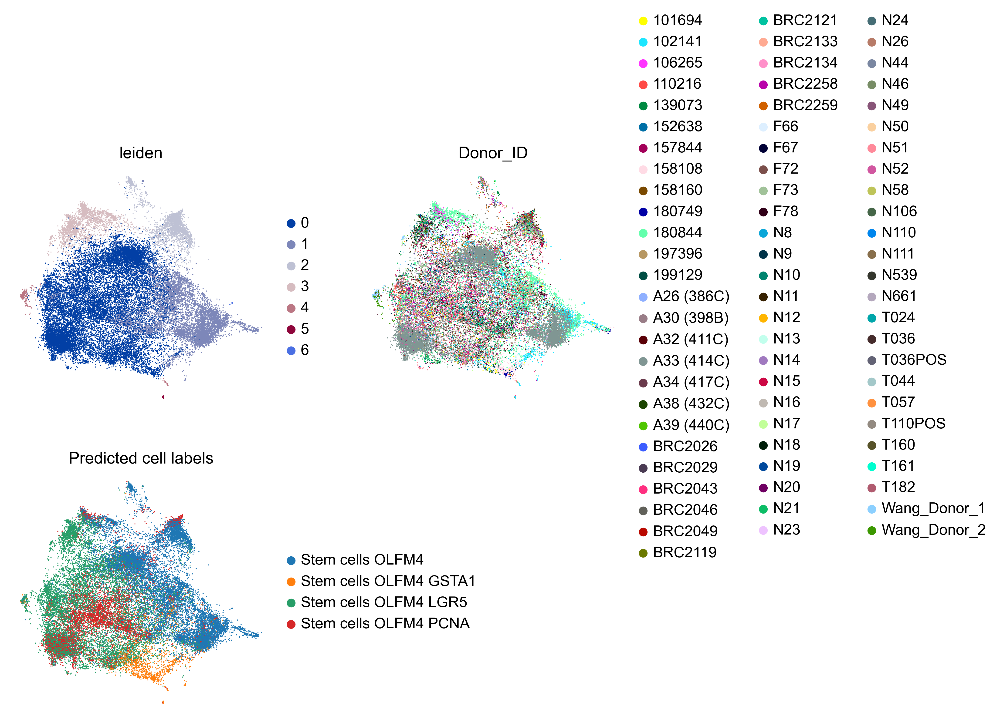

In [48]:
sc.pl.embedding(
    adata,
    basis="X_mde",
    color=["leiden", "Donor_ID", "Predicted cell labels"],
    frameon=False,
    ncols=2,
)

### Integration with scANVI

In [36]:
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=adata,
    labels_key="Predicted cell labels",
    unlabeled_category="Unknown",
)

In [37]:
lvae.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [03:42<00:00, 10.21s/it, loss=520, v_num=1]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [03:42<00:00, 11.12s/it, loss=520, v_num=1]


In [38]:
adata.obsm["X_scANVI"] = lvae.get_latent_representation(adata)

In [39]:
adata.obsm["X_mde_scanvi"] = mde(adata.obsm["X_scANVI"])

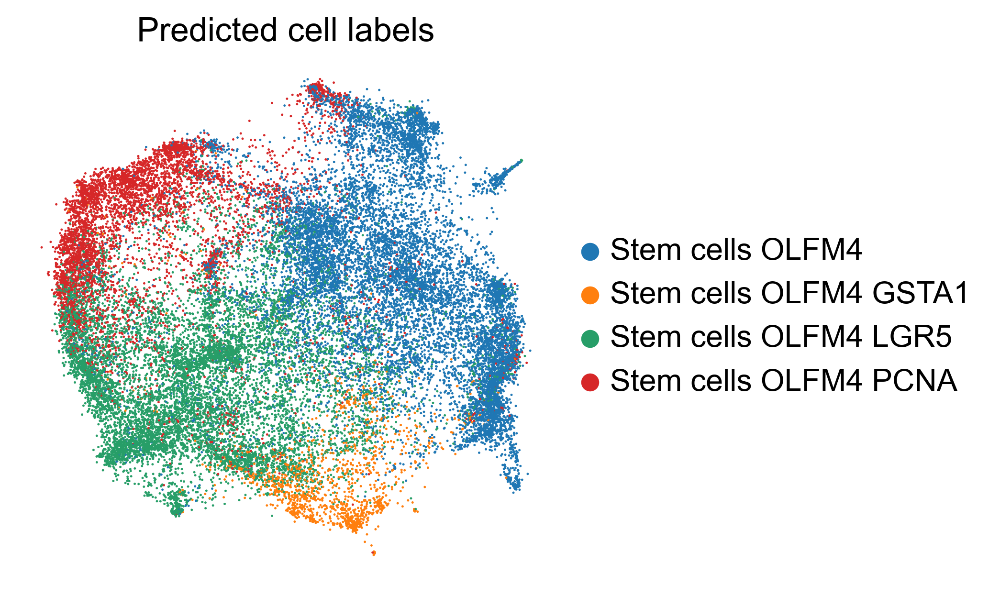

In [40]:
sc.pl.embedding(
    adata, basis="X_mde_scanvi", color=["Predicted cell labels"], ncols=1, frameon=False
)

### Compute integration metrics

In [41]:
bm = Benchmarker(
    adata,
    batch_key="Donor_ID",
    label_key="C_scANVI",
    embedding_obsm_keys=["X_pca", "X_scVI", "X_scANVI"],
    n_jobs=-1,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:06)


Embeddings: 100%|██████████| 3/3 [02:44<00:00, 54.83s/it] 


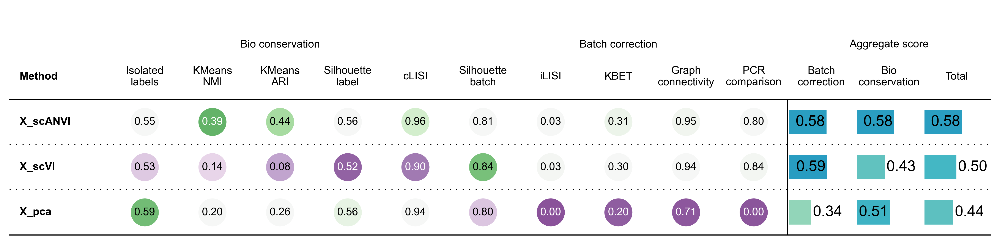

In [42]:
bm.plot_results_table(min_max_scale=False)

In [43]:
df = bm.get_results(min_max_scale=False)
print(df)

Isolated labels        KMeans NMI        KMeans ARI  \
Embedding                                                           
X_pca                0.585027          0.200958          0.262267   
X_scVI               0.529506          0.135912          0.084161   
X_scANVI              0.54712          0.393871          0.438142   
Metric Type  Bio conservation  Bio conservation  Bio conservation   

             Silhouette label             cLISI  Silhouette batch  \
Embedding                                                           
X_pca                0.564048          0.941136           0.79826   
X_scVI                0.52274          0.896982          0.841041   
X_scANVI             0.558208          0.958529          0.812603   
Metric Type  Bio conservation  Bio conservation  Batch correction   

                        iLISI              KBET Graph connectivity  \
Embedding                                                            
X_pca                0.000585          0.199102           0.707474   
X_scVI               0.025586          0.295775           0.938321   
X_scANVI             0.025002          0.306588           0.952685   
Metric Type  Batch correction  Batch correction   Batch correction   

               PCR comparison Batch correction Bio conservation  \
Embedding                                                         
X_pca                     0.0         0.341084         0.510687   
X_scVI               0.837966         0.587738          0.43386   
X_scANVI             0.804335         0.580243         0.579174   
Metric Type  Batch correction  Aggregate score  Aggregate score   

                       Total  
Embedding                     
X_pca               0.442846  
X_scVI              0.495411  
X_scANVI            0.579601  
Metric Type  Aggregate score

# 5000 HVGs

In [49]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_5K_HVG.h5ad'
output = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_5K_HVG_output.h5ad'
adata_5K = sc.read_h5ad(input)

In [50]:
# Rename C_scANVI to the 'Predicted stem cells' label
adata_5K.obs['Predicted cell labels'] = adata_5K.obs['C_scANVI']

### Integration with scVI

In [51]:
scvi.model.SCVI.setup_anndata(adata_5K, layer="counts", batch_key='Donor_ID')

In [52]:
vae = scvi.model.SCVI(adata_5K, n_layers=2, n_latent=30, gene_likelihood="nb")

In [53]:
vae.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 256/256: 100%|██████████| 256/256 [41:02<00:00,  9.20s/it, loss=1.41e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=256` reached.


Epoch 256/256: 100%|██████████| 256/256 [41:02<00:00,  9.62s/it, loss=1.41e+03, v_num=1]


* Evaluate the latent representation of each cell in the dataset and add it to the AnnData object

In [54]:
adata_5K.obsm["X_scVI"] = vae.get_latent_representation()

* Cluster the dataset and visualize it the scVI latent space.

In [55]:
sc.pp.neighbors(adata_5K, use_rep="X_scVI")
sc.tl.leiden(adata_5K, resolution = 0.2, random_state = 1786)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


* Visualize the scVI’s learned embedding

In [56]:
adata_5K.obsm["X_mde"] = mde(adata_5K.obsm["X_scVI"])

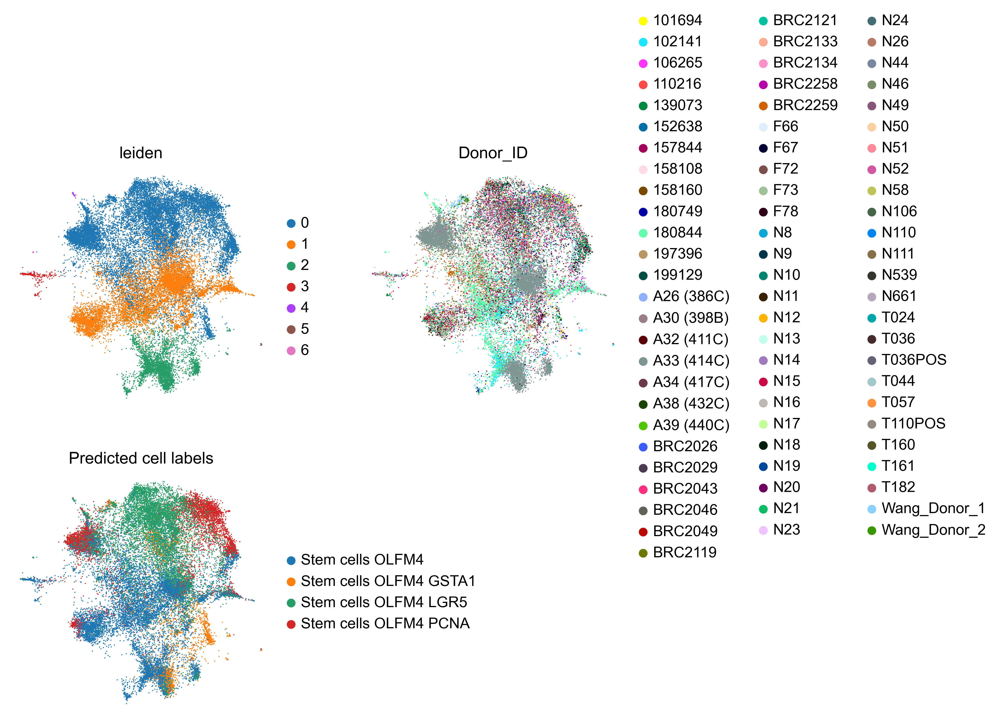

In [57]:
sc.pl.embedding(
    adata_5K,
    basis="X_mde",
    color=["leiden", "Donor_ID", "Predicted cell labels"],
    frameon=False,
    ncols=2,
)

### Integration with scANVI

In [58]:
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=adata_5K,
    labels_key="Predicted cell labels",
    unlabeled_category="Unknown",
)

In [59]:
lvae.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [04:11<00:00, 12.28s/it, loss=1.45e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [04:11<00:00, 12.58s/it, loss=1.45e+03, v_num=1]


In [60]:
adata_5K.obsm["X_scANVI"] = lvae.get_latent_representation(adata_5K)

In [61]:
adata_5K.obsm["X_mde_scanvi"] = mde(adata_5K.obsm["X_scANVI"])

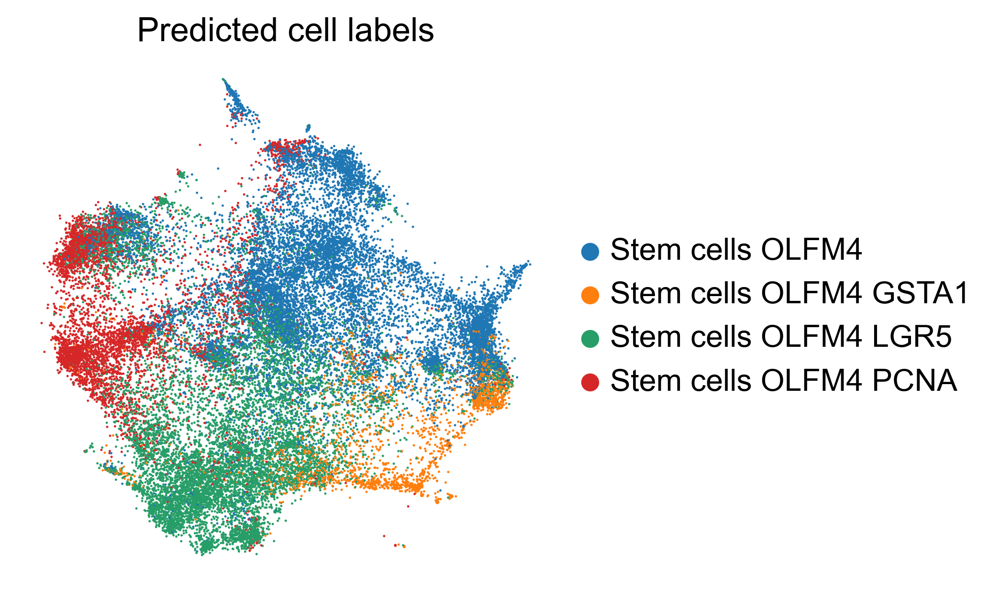

In [62]:
sc.pl.embedding(
    adata_5K, basis="X_mde_scanvi", color=["Predicted cell labels"], ncols=1, frameon=False
)

### Compute integration metrics

In [73]:
bm_5K = Benchmarker(
    adata_5K,
    batch_key="Donor_ID",
    label_key="C_scANVI",
    embedding_obsm_keys=["X_pca", "X_scVI", "X_scANVI"],
    n_jobs=-1,
)
bm_5K.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:14)


Embeddings: 100%|██████████| 3/3 [03:12<00:00, 64.02s/it]


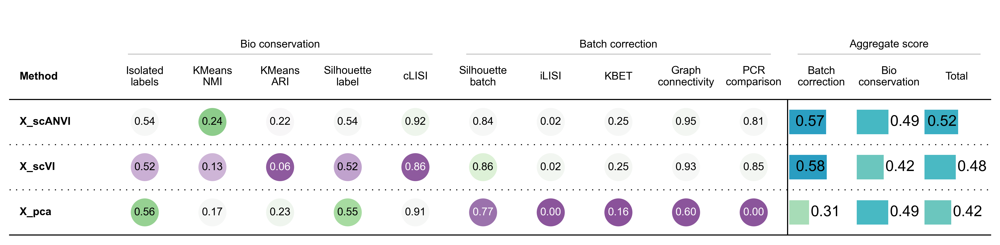

: 

In [ ]:
bm_5K.plot_results_table(min_max_scale=False)

In [72]:
df_5K = bm_5K.get_results(min_max_scale=False)
print(df_5K)

Isolated labels        KMeans NMI        KMeans ARI  \
Embedding                                                           
X_pca                0.561486           0.17446           0.23335   
X_scVI               0.517537          0.129191          0.064914   
X_scANVI             0.537026          0.238116          0.220544   
Metric Type  Bio conservation  Bio conservation  Bio conservation   

             Silhouette label             cLISI  Silhouette batch  \
Embedding                                                           
X_pca                0.554371          0.910676          0.774532   
X_scVI               0.518504          0.858177          0.862318   
X_scANVI             0.536792          0.915526          0.842209   
Metric Type  Bio conservation  Bio conservation  Batch correction   

                        iLISI              KBET Graph connectivity  \
Embedding                                                            
X_pca                0.000535          0.156791           0.604688   
X_scVI               0.024627          0.252185           0.932604   
X_scANVI             0.023524          0.249416            0.94608   
Metric Type  Batch correction  Batch correction   Batch correction   

               PCR comparison Batch correction Bio conservation  \
Embedding                                                         
X_pca                     0.0         0.307309         0.486869   
X_scVI               0.846766           0.5837         0.417665   
X_scANVI             0.810793         0.574404         0.489601   
Metric Type  Batch correction  Aggregate score  Aggregate score   

                       Total  
Embedding                     
X_pca               0.415045  
X_scVI              0.484079  
X_scANVI            0.523522  
Metric Type  Aggregate score